In [7]:
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd
import math
from sklearn import datasets
import pickle
import time
from sklearn_som.som import SOM
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import calinski_harabasz_score

def count_kmers(sequence, k_size):
    data = {}
    size = len(sequence)
    for i in range(size - k_size + 1):
        kmer = sequence[i: i + k_size]
        try:
            data[kmer] += 1
        except KeyError:
            data[kmer] = 1
    return data

def Merge(dict1, dict2):
    return(dict2.update(dict1))


In [2]:
path = "C:/Users/Evint/Documents/College Classes/VANT 148 VGM/Source code/Datas/agentLeadToCancer.csv"
df = pd.read_csv(path)
listDNA = df["DNA Strain"].values
listDNA = np.unique(listDNA)

In [31]:
print("Encode the DNA list")
averagelength = sum([len(item) for item in listDNA])/len(listDNA)
int(math.log(averagelength,4))
kmerList = list()
for strains in listDNA:
    kmerList.append(count_kmers(strains,int(math.log(averagelength,4))))


Encode the DNA list


In [32]:
X = {}
print("encode the parameter of the list")
for dicts in kmerList:
    X.update(dicts)
X = list(X.keys())
params = X
listDF = list()
for dicts in kmerList:
    dictToList = list()
    for keys in X:
        try:
            dictToList.append(dicts[keys])
        except:
            dictToList.append(0)
    listDF.append(dictToList)
listDF

encode the parameter of the list


[[1,
  4,
  2,
  4,
  3,
  7,
  6,
  7,
  5,
  4,
  3,
  3,
  2,
  2,
  1,
  1,
  2,
  2,
  3,
  4,
  3,
  5,
  4,
  2,
  2,
  5,
  9,
  11,
  2,
  5,
  3,
  8,
  8,
  5,
  2,
  3,
  3,
  2,
  4,
  6,
  3,
  6,
  4,
  4,
  3,
  3,
  3,
  3,
  3,
  7,
  10,
  2,
  4,
  3,
  2,
  3,
  4,
  3,
  3,
  3,
  3,
  2,
  2,
  3,
  3,
  7,
  6,
  1,
  3,
  7,
  2,
  2,
  1,
  4,
  1,
  1,
  5,
  3,
  2,
  2,
  3,
  4,
  6,
  6,
  5,
  5,
  4,
  1,
  3,
  4,
  3,
  2,
  2,
  2,
  2,
  2,
  6,
  4,
  10,
  6,
  2,
  5,
  5,
  2,
  3,
  1,
  1,
  7,
  2,
  4,
  6,
  3,
  4,
  4,
  2,
  4,
  2,
  4,
  2,
  1,
  2,
  2,
  2,
  1,
  3,
  2,
  3,
  2,
  4,
  6,
  3,
  5,
  4,
  3,
  5,
  4,
  1,
  4,
  2,
  1,
  1,
  2,
  3,
  4,
  7,
  3,
  2,
  3,
  5,
  3,
  1,
  6,
  6,
  3,
  10,
  6,
  3,
  2,
  3,
  1,
  2,
  4,
  3,
  3,
  4,
  7,
  2,
  1,
  2,
  1,
  2,
  7,
  3,
  3,
  4,
  2,
  3,
  2,
  3,
  5,
  3,
  4,
  1,
  2,
  3,
  3,
  5,
  4,
  2,
  2,
  5,
  3,
  6,
  2,
  1,
  1,
  1,
  2,
  2,
 

In [33]:
df = pd.DataFrame(listDF, columns=params)
df

,ataag,taaga,aagag,agaga,gagaa,agaag,gaagg,aagga,aggag,ggaga,...,ggcaa,cgcat,aattc,ccaat,tcatt,tagcc,gctag,tagtc,gtatg,ctagt
0,1,4,2,4,3,7,6,7,5,4,...,0,0,0,0,0,0,0,0,0,0
1,0,1,2,4,2,3,4,4,3,3,...,0,0,0,0,0,0,0,0,0,0
2,0,1,1,3,2,3,4,4,2,3,...,0,0,0,0,0,0,0,0,0,0
3,0,1,1,3,2,3,4,4,2,3,...,0,0,0,0,0,0,0,0,0,0
4,0,3,2,4,3,5,4,6,4,4,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73468,0,1,2,4,2,3,4,4,3,3,...,0,0,0,0,0,0,0,0,0,0
73469,0,1,2,4,3,4,4,5,4,3,...,0,0,0,0,0,0,0,0,0,0
73470,1,3,2,3,1,5,6,4,3,2,...,0,0,0,0,0,0,0,0,0,0
73471,0,1,2,4,2,3,4,4,2,3,...,0,0,0,0,0,0,0,0,0,0


In [34]:
df.to_csv("C:/Users/Evint/Documents/College Classes/VANT 148 VGM/Source code/Datas/encodedALC.csv")

In [2]:
df = pd.read_csv("C:/Users/Evint/Documents/College Classes/VANT 148 VGM/Source code/Datas/encodedALC.csv")
df.drop("Unnamed: 0", axis=1, inplace=True)
df.drop_duplicates
X = df.values
df.shape

(73473, 1024)

In [3]:
def factorize(n : int) -> list:
    factor = list()
    i = 1
    while i*i <= n:
        if n%i == 0:
            factor.append(i)
        i += 1
    return factor

In [4]:
def som_clustering(X, n_cluster, max_iter=3000, epoch=1, lr = 1):
    factors = factorize(n_cluster)
    models = list()
    models_silhouetterScore = list()
    for num in factors:
        clustering_model = SOM(m=num, n=int(n_cluster/num), dim=X.shape[1], max_iter=max_iter, lr = lr)
        clustering_model.fit(X, epochs= epoch)
        predictions = clustering_model.predict(X)
        models.append(clustering_model)
        models_silhouetterScore.append(silhouette_score(X, predictions))
    return models[np.array(models_silhouetterScore).argmax()], max(models_silhouetterScore)

In [5]:
def test_som(X, array_n_cluster, max_iter=3000, epoch = 1, lr = 1):
    models_hist = list()
    # models_silhouetterScore = list()
    hist = list()
    for n_cluster in array_n_cluster:
        model, silhouette_score = som_clustering(X, n_cluster, max_iter=max_iter, epoch= epoch, lr = lr)
        predictions = model.predict(X)
        dbs = davies_bouldin_score(X, predictions)
        chs = calinski_harabasz_score(X, predictions)
        models_hist.append(model)
        # models_silhouetterScore.append(silhouette_score)
        cluster_center = model.cluster_centers_.shape[0]*model.cluster_centers_.shape[1]
        hist.append([model.m, model.n, cluster_center, model.dim, silhouette_score, dbs, chs])
    return hist, models_hist

In [6]:
def find_SOM(X, random_state = 5, total_rep = 10, max_iter = 3000, epoch = 1, lr = 1):
    if random_state == 1:
        array_n_cluster = [random_state*i for i in range(2,total_rep+2)]
    else :
        array_n_cluster = [random_state*i for i in range(1,total_rep+2)]
    return test_som(X, array_n_cluster, max_iter=max_iter, epoch = epoch, lr = lr)

In [7]:
ans, models = find_SOM(X, random_state = 1, total_rep = 10)
p = pd.DataFrame(ans, 
             columns=[ "matrix width", "matrix height", "total cluster", "dimension", "silhouette score", "davies bouldin score", "calinski harabasz score"])
p

,matrix width,matrix height,total cluster,dimension,silhouette score,davies bouldin score,calinski harabasz score
0,1,2,2,1024,0.147701,1.916611,16474.200647
1,1,3,3,1024,0.160660,1.744049,16524.262787
2,2,2,4,1024,0.161870,2.221176,12450.378759
3,1,5,5,1024,0.151789,2.274627,12247.924131
4,1,6,6,1024,0.189181,2.009634,12066.394881
5,1,7,7,1024,0.145681,2.397366,10401.865927
6,1,8,8,1024,0.169506,2.488211,9401.853575
7,1,9,9,1024,0.158971,2.410301,8955.428325
8,2,5,10,1024,0.192592,2.294985,8400.826423
9,1,11,11,1024,0.097970,2.539944,7728.040124


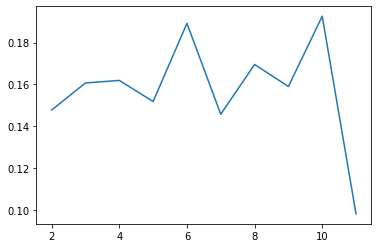

In [9]:
plt.plot(p["total cluster"], p["silhouette score"])

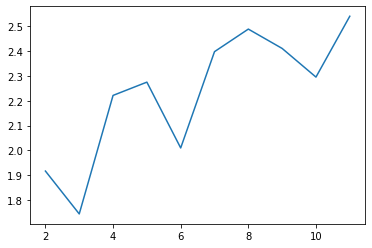

In [10]:
plt.plot(p["total cluster"], p["davies bouldin score"])

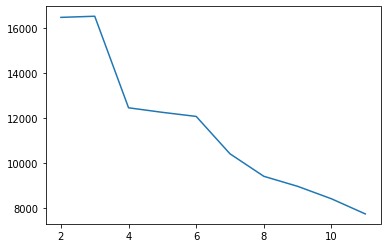

In [11]:
plt.plot(p["total cluster"], p["calinski harabasz score"])

In [14]:
p.to_csv("C:/Users/Evint/Documents/College Classes/VANT 148 VGM/Source code/Datas/modelData.csv")
p.to_excel("C:/Users/Evint/Documents/College Classes/VANT 148 VGM/Source code/Datas/modelData.xlsx")

In [16]:
model = models[np.array(p["silhouette score"]).argmax()]

In [17]:
cluster_center = list()
for i in model.cluster_centers_:
    for j in i:
        cluster_center.append(j)
cluster_center

[array([0.74034583, 1.43992561, 2.34636341, ..., 0.48140743, 0.3828322 ,
        0.95949016]),
 array([0.2734149 , 1.26790598, 1.97713842, ..., 0.13037546, 0.0898956 ,
        0.35825686]),
 array([0.11796755, 1.19873502, 1.90180035, ..., 0.08856067, 0.06020798,
        0.09960074]),
 array([0.32455699, 1.43658978, 2.18666083, ..., 0.35126467, 0.31901319,
        0.34292515]),
 array([0.72306271, 2.05765824, 3.01692098, ..., 0.66062787, 0.67927036,
        0.80830967]),
 array([0.92477831, 1.33908259, 2.19225566, ..., 0.53663686, 0.62636307,
        0.81267792]),
 array([0.37654969, 1.28251068, 1.85357395, ..., 0.21137643, 0.19582983,
        0.36190297]),
 array([0.27628655, 1.30430599, 1.93822338, ..., 0.25519517, 0.2379612 ,
        0.27010001]),
 array([0.92774223, 1.80913953, 2.56937682, ..., 0.9741406 , 0.95385778,
        0.98742048]),
 array([1.59447372, 2.47383637, 3.21565661, ..., 1.47294269, 1.49893475,
        1.78471799])]

In [8]:
center_list = pd.DataFrame(cluster_center, columns=df.columns)
center_list.to_csv("C:/Users/Evint/Documents/College Classes/VANT 148 VGM/Source code/Datas/clusterCenter.csv")
center_list.to_excel("C:/Users/Evint/Documents/College Classes/VANT 148 VGM/Source code/Datas/clusterCenter.xlsx")

NameError: name 'df' is not defined

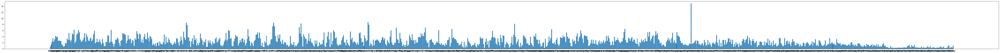

In [57]:
plt.figure(figsize=(100,5))
plt.bar(x = df.columns, height = cluster_center[0])
plt.savefig("C:/Users/Evint/Documents/College Classes/VANT 148 VGM/Source code/Datas/histCC{}".format(1))

In [9]:
cluster_center = pd.read_csv("C:/Users/Evint/Documents/College Classes/VANT 148 VGM/Source code/Datas/clusterCenter.csv")
cluster_center.drop("Unnamed: 0", axis=1, inplace=True)
cluster_center.head()

,ataag,taaga,aagag,agaga,gagaa,agaag,gaagg,aagga,aggag,ggaga,...,ggcaa,cgcat,aattc,ccaat,tcatt,tagcc,gctag,tagtc,gtatg,ctagt
0,0.740346,1.439926,2.346363,3.521879,2.329479,3.103950,4.205754,3.837092,3.944390,2.636361,...,0.241916,0.260349,0.350268,0.778448,1.151649,0.342934,0.405683,0.481407,0.382832,0.959490
1,0.273415,1.267906,1.977138,3.719302,2.340863,3.444882,4.283222,4.246796,3.462014,2.927095,...,0.078738,0.107984,0.128113,0.268793,0.413812,0.164431,0.145610,0.130375,0.089896,0.358257
2,0.117968,1.198735,1.901800,3.865636,2.520878,3.645881,4.323031,4.574619,3.471425,3.202199,...,0.086217,0.128392,0.149646,0.135309,0.097658,0.190255,0.124960,0.088561,0.060208,0.099601
3,0.324557,1.436590,2.186661,4.357907,2.939698,4.208916,4.876460,5.218390,3.902054,3.720928,...,0.367304,0.298820,0.385530,0.433845,0.316495,0.430675,0.368896,0.351265,0.319013,0.342925
4,0.723063,2.057658,3.016921,5.642023,3.738874,5.472456,6.115469,6.554582,4.832862,4.837325,...,0.715961,0.529095,0.684224,0.728460,0.725202,0.806895,0.690546,0.660628,0.679270,0.808310


In [10]:
cluster_center.shape

(10, 1024)

histogram for cluster center number: 0
histogram for cluster center number: 1
histogram for cluster center number: 2
histogram for cluster center number: 3
histogram for cluster center number: 4
histogram for cluster center number: 5
histogram for cluster center number: 6
histogram for cluster center number: 7
histogram for cluster center number: 8
histogram for cluster center number: 9


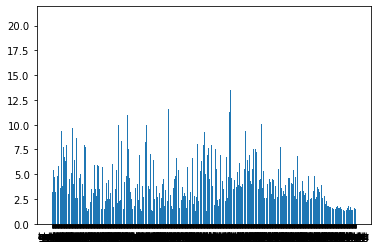

In [12]:
for i in range(cluster_center.shape[0]):
    print("histogram for cluster center number: {}".format(i))
    plt.clf()
    plt.bar(cluster_center.columns, cluster_center.loc[i])
    plt.savefig("C:/Users/Evint/Documents/College Classes/VANT 148 VGM/Source code/Datas/histCC{}.png".format(i))
    

In [12]:
clustered_df = df
clustered_df["label"] = model.predict(X)
clustered_df["label"].value_counts()

7    22651
3    10018
9     9015
0     6836
6     5369
4     5314
5     4956
1     4838
8     2802
2     1674
Name: label, dtype: int64

In [13]:
path = "C:/Users/Evint/Documents/College Classes/VANT 148 VGM/Source code/Datas/clusteredAgentLeadToCancer.csv"
clustered_df.to_csv(path)